In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
pip install --upgrade pip

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install pytorch-lightning

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install -q plotly

Note: you may need to restart the kernel to use updated packages.


In [7]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

!pip install torch-scatter torch-sparse torch_geometric

2.4.0+cpu


In [2]:
!pip install pygsp

  Using cached PyGSP-0.5.1-py2.py3-none-any.whl.metadata (6.9 kB)
Using cached PyGSP-0.5.1-py2.py3-none-any.whl (1.8 MB)


In [10]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [2]:
from torch_geometric.nn.pool import radius
import torch
from torch import nn

import os
import time

V = lambda x: x.detach().cpu().numpy()
from numpy import newaxis, mean, savetxt
import networkx as nx
import numpy as np

import scipy
from scipy import spatial
from scipy.spatial import cKDTree
from scipy import sparse
from scipy.sparse import csgraph

import plotly.graph_objects as go
import plotly.io as pio 

import random

#GCN -----------
from torch_geometric.nn import GCNConv

#GAT ----------
from torch_geometric.nn import GATConv

#GN -----------
from torch.nn import Sequential as Seq, Linear as Lin, ReLU
from torch_scatter import scatter_mean

from mpl_toolkits.mplot3d import Axes3D
import pygsp

shown = False

class NodeModel(torch.nn.Module):
    def __init__(self, in_feat, out_feat):
        super().__init__()

        self.in_feat = in_feat
        self.out_feat = out_feat

        self.node_mlp_1 = Seq(Lin(self.in_feat, self.in_feat, bias = False), ReLU(), Lin(self.in_feat, self.in_feat, bias = False))
        self.node_mlp_2 = Seq(Lin(2*self.in_feat, self.in_feat, bias = False), ReLU(), Lin(self.in_feat, self.out_feat, bias = False))

    def forward(self, x, edge_index):
        # x: [N, F_x], where N is the number of nodes.
        # edge_index: [2, E] with max entry N - 1.
        # edge_attr: [E, F_e]
        # u: [B, F_u]
        # batch: [N] with max entry B - 1.
        row, col = edge_index
        out = x[row]
        out = self.node_mlp_1(out)
        out = scatter_mean(out, col, dim=0, dim_size=x.size(0))
        out = torch.cat([x, out], dim=1)

        return self.node_mlp_2(out)

def floyd_warshall(A):
    n = len(A)
    d = torch.zeros(n, n)
    for i in range(n):
        for j in range(n):
            if i!=j:
                d[i, j]=float('inf')
            if A[i][j]!=0:
                d[i, j] = A[i][j]

    for k in range(n):
        for i in range(n):
            for j in range(n):
                if d[i, k]!=float('inf') and d[k, j]!=float('inf'):
                    d[i, j]=torch.minimum(d[i, j], d[i, k]+d[k, j])

    return d

def dist(X, i, j):
  res = torch.sqrt(torch.square(X[i, 0] - X[j, 0]) + torch.square(X[i, 1] - X[j, 1]))
  return res

def calculate_distance(point1, point2):
    return torch.sqrt(torch.sum(torch.pow(point1 - point2, 2)))

def systemEnergy(X, l, k):
    # Обчислення відстаней між усіма парами точок
    distances = torch.cdist(X, X)

    # Ініціалізація змінної для зберігання загальної енергії
    resE = torch.sum(k * torch.square(distances - l)) / 2

    return resE



#Loss function -----------

MIN_REPUL_DIST = 1e-3
radius = .4
magnitude = 10

def Repulsion(X):
    # assuming X: (n,d)
    dX = X[newaxis] - X[:,newaxis] # (n,n,d)
    # have to remove the diagonal (self-loops)
    # dX shouldn't be calc'd for self.
    # mask = torch.ones(len(X), len(X))- torch.eye(len(X))
    #return torch.sum(1/ (MIN_REPUL_DIST + torch.norm(dX, dim=(-1))))

    r = torch.sum( dX**2, dim = -1)
    return magnitude*torch.sum(torch.exp( -r/4/(radius**2) ))



def Elastic(X, A):
    D = torch.diag(torch.sum(A,dim = 1))
    # Laplacian
    L = D - A
    return torch.trace(X.t() @ L @ X)

def Loss(X,A,c=1):
    return Elastic(X,A) + c * Repulsion(X)

def Elastic_edgelist(X, edg):
    # if edg.shape[-1] == 2:
    return torch.sum((X[edg[:,0]]-X[edg[:,1]])**2)/2

def Loss_edgelist(X,edg,c=1):
    return Elastic_edgelist(X,edg) + c * Repulsion(X)


#Alternative GCN models -----------
class GCN(nn.Module):
    def __init__(self, in_feat, out_feat, A=None, edgelist=None, N=None):
        """A: Adjacency matrix
        if A is gven, edgelist ignored.
        If edglelist given, max index in edgelist is assumed to be number of nodes N, unless N is given.
        """
        super(GCN,self).__init__()
        if A!=None:
            self.A = torch.as_tensor(A)
        elif len(edgelist):
            raise

        self.in_feat = in_feat
        self.out_feat = out_feat
        self.W = nn.Parameter(torch.empty(in_feat, out_feat))
        nn.init.kaiming_normal_(self.W)

    def forward(self, x):
        return self.A @ x @ self.W


class GCN_Lowrank(nn.Module):
    def __init__(self, in_feat, out_feat, A=None, pc_num_frac = 0.1,
                 edgelist=None, N=None):
        """A: Adjacency matrix
        if A is gven, edgelist ignored.
        If edglelist given, max index in edgelist is assumed to be number of nodes N, unless N is given.
        """
        super(GCN_Lowrank,self).__init__()
        if A!=None:
            self.A = torch.as_tensor(A)
            self._prep_A_lowrank(A, pc_num_frac)
        elif len(edgelist):
            raise

        self.in_feat = in_feat
        self.out_feat = out_feat
        self.W = nn.Parameter(torch.empty(in_feat, out_feat))
        nn.init.kaiming_normal_(self.W)

    def _prep_A_lowrank(self, A, pc_num_frac):
        A = torch.as_tensor(A)
        A = (A+A.t())/2
        v,p = torch.linalg.eigh(A)
        k = int(pc_num_frac * len(A))
        idx = torch.argsort(v, descending=True)[:k]
        self.pval, self.pvec = v[:k], p[:,:k]
        self.pvec_tv = (self.pvec * self.pval).t()

    def agg(self,x):
        x = self.pvec_tv @ x
        return self.pvec @ x

    def forward(self, x):
        # return self.A @ x @ self.W
        return self.agg(x) @ self.W


def time_it(f):
    def dt(*args, **kw):
        t0 = time.time()
        a = f(*args, **kw)
        print('%s time: %.3g s'%(f.__name__,time.time()-t0))
        # return a
    return dt

#NeuLay model -----------
class ResGCN(nn.Module):
    def __init__(self, feat_dims = [1,1], A=None, edge_index = None, edgelist=None, normalize_A = True,
                activation = None, device = None, lr = 1e-2, GCN_class = GCN):
        super(ResGCN,self).__init__()
        if device==None:
            device = ('cuda' if torch.cuda.is_available() else 'cpu')
            print(device)
        self.device = torch.device(device)

        if edgelist!=None:
            self.edgelist = torch.tensor(edgelist, dtype = torch.long).to(self.device)
            A = torch.zeros(n,n, dtype = torch.float32).to(self.device)
            for i,j in self.edgelist:
                A[i,j] = 1
                # A[j,i] = 1
            self.Loss = lambda x: Loss_edgelist(x,self.edgelist)
            self.A = torch.as_tensor(A).to(self.device)

        elif A!=None:

            L0=2

            constK=1

            n=len(A)

            d=torch.tensor(scipy.sparse.csgraph.floyd_warshall(A.numpy()))

            self.A=torch.as_tensor(A).to(self.device)

            k = constK / (d ** 2)
            k.fill_diagonal_(0)
            self.k=k

            maxd = torch.max(d).item()

            L=L0/maxd

            l = d
            self.l=l
            self.systemEnergy = lambda x: systemEnergy(x, self.l, self.k)

            #self.Loss = lambda x: Loss(x, self.A)

        self.edge_index = edge_index.to(self.device)

        # if normalize_A:
        #     degs = self.A.sum(dim=1)
        #     self.DA = torch.diag(1/(1e-1+degs)) @ self.A
        # else:
        #     self.DA = self.A

        n = len(self.A)
        # =====  Module Parameters ======
        self.latent = nn.Parameter(torch.empty(n,feat_dims[0]).to(self.device))
        r = n**(1./feat_dims[0])
        print("latent radius {:.3g}".format(r))
        nn.init.normal_(self.latent,std = r)

        
        #self.gcn_list = nn.ModuleList([GCN_class(feat_dims[i], feat_dims[i+1], A=self.DA).to(self.device)
         #                              for i in range(len(feat_dims)-2)])

        if GCN_class == 'GCNConv':
          self.gcn_list = nn.ModuleList([GCNConv(feat_dims[i], feat_dims[i+1], improved= True, bias = False ).to(self.device)
                                        for i in range(len(feat_dims)-2)])
        if GCN_class == 'GATConv':
          self.gcn_list = nn.ModuleList([GATConv(feat_dims[i], feat_dims[i+1], bias = False).to(self.device)
                                         for i in range(len(feat_dims)-2)])

        if GCN_class == 'GraphNet':
          self.gcn_list = nn.ModuleList([NodeModel(feat_dims[i], feat_dims[i+1]).to(self.device)
                                         for i in range(len(feat_dims)-2)])


        self.projection_layer = (nn.Linear(sum(feat_dims[:-1]), feat_dims[-1]).to(self.device)
                                 if len(feat_dims)>1 else nn.Identity())
        self.loss_history = []
        self.optim = torch.optim.Adam(self.parameters(), lr = lr/2)

        self.fine_pos = nn.Parameter(torch.empty(n,feat_dims[-1]).to(self.device))
        nn.init.normal_(self.fine_pos,std = r)
        self.optim_fine = torch.optim.Adam([self.fine_pos], lr = lr)
        
        self.layout_history = []
        self.iter = 0

    def forward(self,):
        out = [self.latent]
        for g in self.gcn_list:
            out += [g(out[-1], self.edge_index)]
        out = torch.concat(out,dim = 1)
        out = self.projection_layer(out)
        return out

    @time_it
    def train(self,gcn_steps=200, fdl_steps=2000, early_stop_check_steps = 50,
              min_steps=100, #stop_delta_ratio = 5e-3,
              gcn_stop_threshold = 2e-3,
              fdl_stop_threshold = 5e-3,
              **stop_kws):
        """train(self,gcn_steps=200, fdl_steps=2000, early_stop_check_steps = 100,
              min_steps=100, #stop_delta_ratio = 5e-3,
              gcn_stop_threshold = 2e-2,
              fdl_stop_threshold = 5e-3,
              **stop_kws):
        """
        try:
            if gcn_steps > 0 and len(self.gcn_list) > 0:
                self.train_gcn(steps=gcn_steps, early_stop_check=early_stop_check_steps,
                               min_steps=min_steps,
                               stop_delta_ratio=gcn_stop_threshold, **stop_kws)
                self.fine_pos.data = self()
            print(f'\nFDL training {fdl_steps} steps')
            self.train_fine(steps=fdl_steps, early_stop_check=early_stop_check_steps,
                            min_steps=min_steps,
                            stop_delta_ratio=fdl_stop_threshold, **stop_kws)
        except KeyboardInterrupt:
            print('\nTraining interrupted')
            return


    @time_it
    def train_gcn(self,steps = 100, early_stop_check = 50, min_steps=100, stop_delta_ratio = 5e-3, **stop_kws):
        for i in range(steps):
            #if i % 10 == 0: print(f"train_gcn step #{i}")
            self.optim.zero_grad()
            # loss = Loss(self(), self.A)
            loss = self.systemEnergy(self())
            #print(self())
            #print(loss)
            #loss=systemEnergy(self(), self.l, self.k)
            #loss.requires_grad = True
            loss.backward()

            self.loss_history += [loss.item()+0.]
            self.optim.step()

            # here we are printing some intermediate layouts
            if ((i % 200)==0):
               #print("{} step, loss = {}".format(i, loss.item()))
               #print(self.fine_pos)
               plot_layout_3d_dynamic(self)
            
            #self.layout_history.append(self.fine_pos.clone().detach())
            
            if i> min_steps and i % early_stop_check == 1:
                # print('checking', i)
                if early_stopping(self.loss_history,stop_delta_ratio=stop_delta_ratio, **stop_kws):
                    print('\n===========\nstopping at step ',i)
                    break

    @time_it
    def train_fine(self,steps = 100, early_stop_check = 50, min_steps=100, stop_delta_ratio = 5e-3, **stop_kws):
        for i in range(steps):
            #if i % 10 == 0: print(f"train_fine step #{i}")
            self.optim_fine.zero_grad()
            # loss = Loss(self.fine_pos, self.A)
            loss = self.systemEnergy(self.fine_pos)
            #loss=systemEnergy(self(), self.l, self.k)
            #loss.requires_grad = True
            #print(loss)
            loss.backward()

            self.loss_history += [loss.item()+0.]
            self.optim_fine.step()

            # here we are printing some intermediate layouts
            if ((i % 50)==0):
               #print("{} step, loss = {}".format(i, loss.item()))
               #print(self.fine_pos)
               plot_layout_3d_dynamic(self)
            # here we are saving each intermediate layout
            self.layout_history.append(self.fine_pos.clone().detach())
            
            if i> min_steps and i % early_stop_check == 1:
                # print('checking', i)
                if early_stopping(self.loss_history,stop_delta_ratio=stop_delta_ratio, **stop_kws):
                    print('\n===========\nstopping at step ',i)
                    break

    def get_node_pos(self):
        return self.fine_pos

    def save_layout(self,save_dir='./', save_name = 'nodes', delimiter=','):
        """saves a nodes.csv """
        pos = V(self.get_node_pos())
        os.makedirs(save_dir, exist_ok=True)
        savetxt(os.path.join(save_dir, save_name+'.csv'), pos, delimiter=delimiter)

        # TBA: create edgelist if not made
        # savetxt(os.path.join(save_dir, 'edges.csv'), self.edgelist, delimiter=delimiter)



def early_stopping(metric_list,
            small_window = 32,
            big_window = 1000,
            stop_delta_ratio = 1e-3, verbose=True):
    if len(metric_list) < 2*small_window:
        return False
    # check if chenges within big window and small window are smaller then the ratio
    big_window = max(big_window, 2*small_window)
    last = mean(metric_list[-small_window:])
    dl_small =  abs(last - mean(metric_list[-2*small_window:-small_window]))
    idx = max(0,len(metric_list)-big_window)
    dl_big = abs(last - mean(metric_list[idx:idx+small_window]))
    ratio = dl_small / dl_big
    if verbose:
        print(f'step: {len(metric_list)}, Loss change ratio: {ratio:.3g}', end='\r')
        # print(f'Loss change ratio: {ratio:.3g}', end='\r')
    return ratio < stop_delta_ratio

def plot_layout_2d(res, dims=[0,1], edges=True, node_kws={}, edg_kws=dict(c='k',lw=.5)):
    x = res.get_node_pos()
    # subplot(aspect='equal')
    scatter(*V(x).T[dims], s=10, zorder = 1000, **node_kws)
    if edges:
        for i,j in  zip(*torch.where(res.A)):
            plot(*V(x[[i.item(),j.item()]]).T[dims], **edg_kws)


def plot_layout_3d(res, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k',lw=1.0)):
    x = res.get_node_pos()
    fig = plt.figure(figsize=(15, 12))  # Збільшуємо розмір графіка
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*V(x).T[dims], s=20, zorder=1000, **node_kws)  # Збільшуємо розмір маркерів
    if edges:
        for i, j in zip(*torch.where(res.A)):
            ax.plot(*V(x[[i.item(),j.item()]]).T[dims], **edg_kws)
    plt.show()


def plot_layout_3d_dynamic(res, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k',lw=1.0)):
    pos = V(res.get_node_pos())

    n = pos.shape[0]

    # Separate the X, Y, Z coordinates for Plotly
    x_nodes = [pos[i][0] for i in range(n)]  # x-coordinates of nodes
    y_nodes = [pos[i][1] for i in range(n)]  # y-coordinates
    z_nodes = [pos[i][2] for i in range(n)]  # z-coordinates

    # Create lists that contain the starting and ending coordinates of each edge
    x_edges = []
    y_edges = []
    z_edges = []

    for edge in edg:
        # format: [beginning, ending, None]
        x_coords = [pos[edge[0]][0], pos[edge[1]][0], None]
        x_edges += x_coords

        y_coords = [pos[edge[0]][1], pos[edge[1]][1], None]
        y_edges += y_coords

        z_coords = [pos[edge[0]][2], pos[edge[1]][2], None]
        z_edges += z_coords

    # Create a trace for the edges
    trace_edges = go.Scatter3d(
        x=x_edges,
        y=y_edges,
        z=z_edges,
        mode='lines',
        line=dict(color='black', width=2),
        hoverinfo='none'
    )

    # Create a trace for the nodes
    trace_nodes = go.Scatter3d(
        x=x_nodes,
        y=y_nodes,
        z=z_nodes,
        mode='markers',
        marker=dict(symbol='circle',
                    size=3,
                    colorscale=['lightgreen', 'magenta'], 
                    line=dict(color='black', width=0.5)),
        hoverinfo='text'
    )

    # Set axis to hide everything
    axis = dict(showbackground=False,
                showline=False,
                zeroline=False,
                showgrid=False,
                showticklabels=False,
                title='')

    # Create layout
    layout_plotly = go.Layout(
        title="",
        width=650,
        height=625,
        showlegend=False,
        scene=dict(xaxis=axis, yaxis=axis, zaxis=axis),
        margin=dict(t=100),
        hovermode='closest'
    )

    # Include the traces we want to plot and create a figure
    data = [trace_edges, trace_nodes]
    fig = go.Figure(data=data, layout=layout_plotly)

    fig.show()

def plot_layout_3d_dynamic_pos(pos, a, edg, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k', lw=1.0)):
    n = pos.shape[0]
    edge_index = torch.tensor(edg).T

    x_nodes = [pos[i][0] for i in range(n)]
    y_nodes = [pos[i][1] for i in range(n)]
    z_nodes = [pos[i][2] for i in range(n)]

    x_edges, y_edges, z_edges = [], [], []

    for edge in edg:
        x_coords = [pos[edge[0]][0], pos[edge[1]][0], None]
        x_edges += x_coords

        y_coords = [pos[edge[0]][1], pos[edge[1]][1], None]
        y_edges += y_coords

        z_coords = [pos[edge[0]][2], pos[edge[1]][2], None]
        z_edges += z_coords

    trace_edges = go.Scatter3d(x=x_edges, y=y_edges, z=z_edges, mode='lines',
                                line=dict(color='black', width=2), hoverinfo='none')

    trace_nodes = go.Scatter3d(x=x_nodes, y=y_nodes, z=z_nodes, mode='markers',
                                marker=dict(symbol='circle', size=3,
                                            colorscale=['lightgreen', 'magenta'],
                                            line=dict(color='black', width=0.5)),
                                hoverinfo='text')

    axis = dict()
    layout_plotly = go.Layout(title="", width=650, height=625, showlegend=False,
                                scene=dict(xaxis=dict(axis), yaxis=dict(axis), zaxis=dict(axis)),
                                margin=dict(t=100), hovermode='closest')

    data = [trace_edges, trace_nodes]
    fig = go.Figure(data=data, layout=layout_plotly)
    fig.show()

def plot_layout_3d_dynamic_save(pos, edg, a, iteration, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k', lw=1.0)):
    n = pos.shape[0]

    x_nodes = [pos[i][0] for i in range(n)]
    y_nodes = [pos[i][1] for i in range(n)]
    z_nodes = [pos[i][2] for i in range(n)]

    x_edges = []
    y_edges = []
    z_edges = []

    for edge in edg:
        x_coords = [pos[edge[0]][0], pos[edge[1]][0], None]
        x_edges += x_coords

        y_coords = [pos[edge[0]][1], pos[edge[1]][1], None]
        y_edges += y_coords

        z_coords = [pos[edge[0]][2], pos[edge[1]][2], None]
        z_edges += z_coords

    trace_edges = go.Scatter3d(x=x_edges, y=y_edges, z=z_edges, mode='lines', line=dict(color='black', width=2), hoverinfo='none')
    trace_nodes = go.Scatter3d(x=x_nodes, y=y_nodes, z=z_nodes, mode='markers', marker=dict(symbol='circle', size=3, colorscale=['lightgreen', 'magenta'], line=dict(color='black', width=0.5)), hoverinfo='text')

    axis = dict()

    layout_plotly = go.Layout(title="", width=650, height=625, showlegend=False, scene=dict(xaxis=dict(axis), yaxis=dict(axis), zaxis=dict(axis)), margin=dict(t=100), hovermode='closest')

    data = [trace_edges, trace_nodes]
    fig = go.Figure(data=data, layout=layout_plotly)

    file_path = f'layout_history4/graph_{iteration}.svg'
    fig.write_html("layout_history4/graph_{}.html".format(iteration))

In [3]:
import json
from networkx.readwrite import json_graph

def read_json_file(filename):
    with open(filename) as f:
        js_graph = json.load(f)
    return json_graph.node_link_graph(js_graph)

#g = read_json_file('/content/drive/MyDrive/GCN_reparametrization/data/internet2006_relabeled.json')

In [4]:
# Space dimensions
DIMENSIONS = 3

# choose GCN small steps
MAX_GCN_STEPS = int(2e3)

# fine-tuning FDL steps. make large
MAX_FDL_STEPS = int(2e4)

# early stopping (lower = runs longer)
GCN_STOP_THRESHOLD = 5e-3
FDL_STOP_THRESHOLD = 2e-3

In [5]:
e = 1

In [6]:
# Here we are creating the graph for our test

G1 = nx.grid_graph(dim=[8, 8, 8])

a = torch.tensor(nx.adjacency_matrix(G1).todense()) # creating the adjacency matrix
nV = 512 # the number of vertices

# creating the edgeList
edg = []
for i in range(nV):
    for j in range(nV):
        if a[i][j] != 0:
            edg.append([i, j])

edge_index = torch.tensor(edg).T

# The NetworkX has some problems with the grid graphs, so we need to rebuild the G1 before using it
G = nx.Graph()
G.add_nodes_from(range(nV))
G.add_edges_from(edg)

cpu
latent radius 1.06


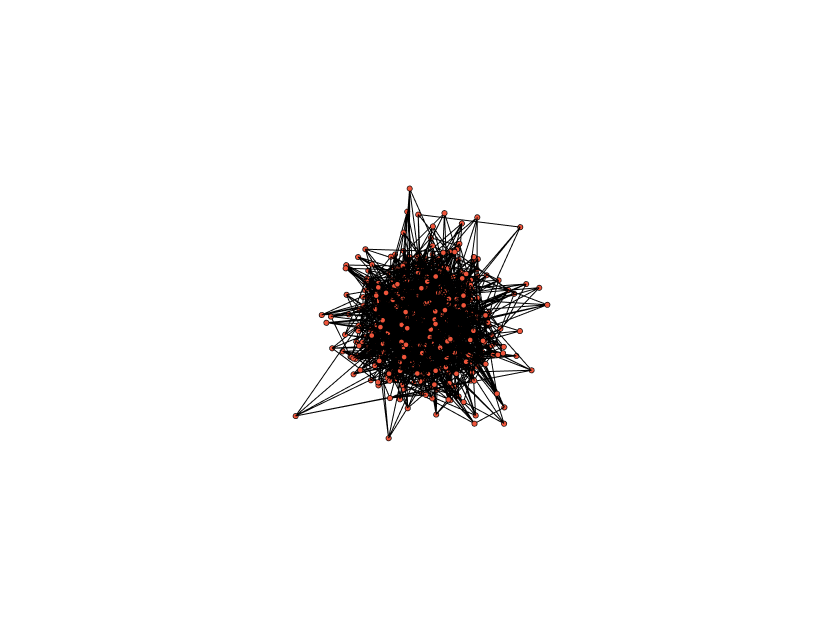

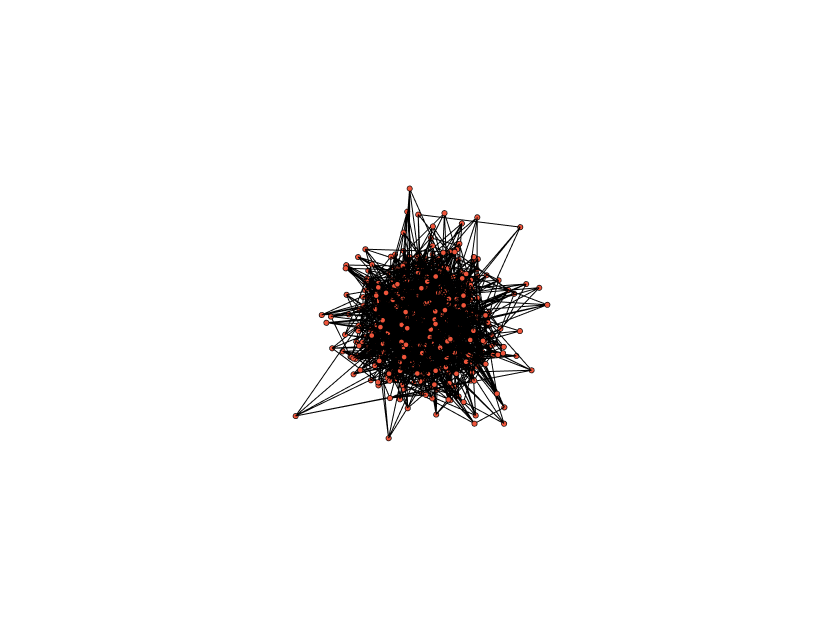

step: 302, Loss change ratio: 0.00186
stopping at step  301
train_gcn time: 14 s

FDL training 20000 steps


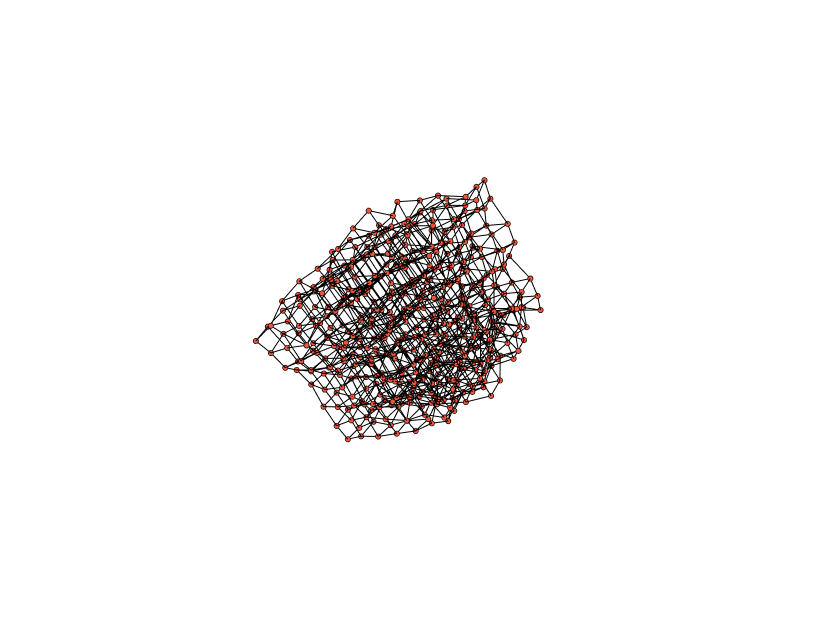

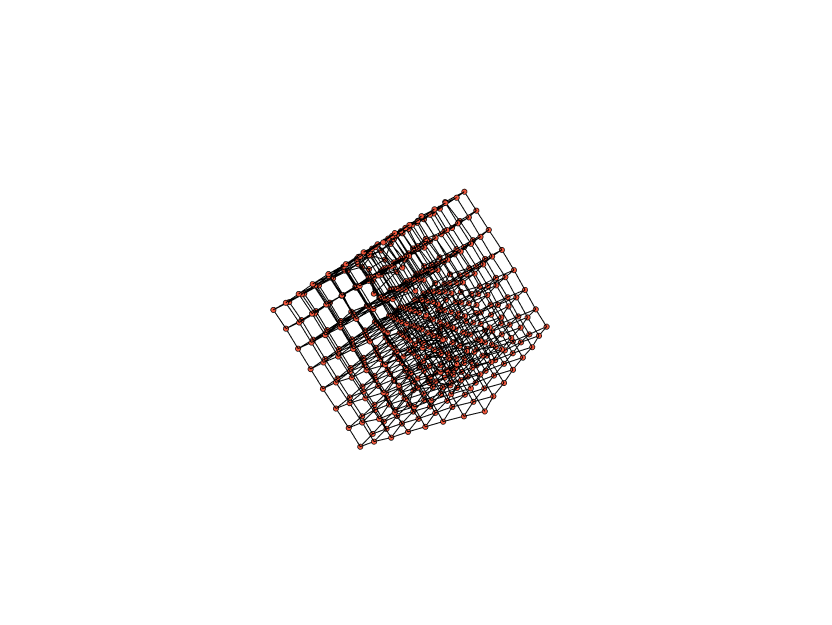

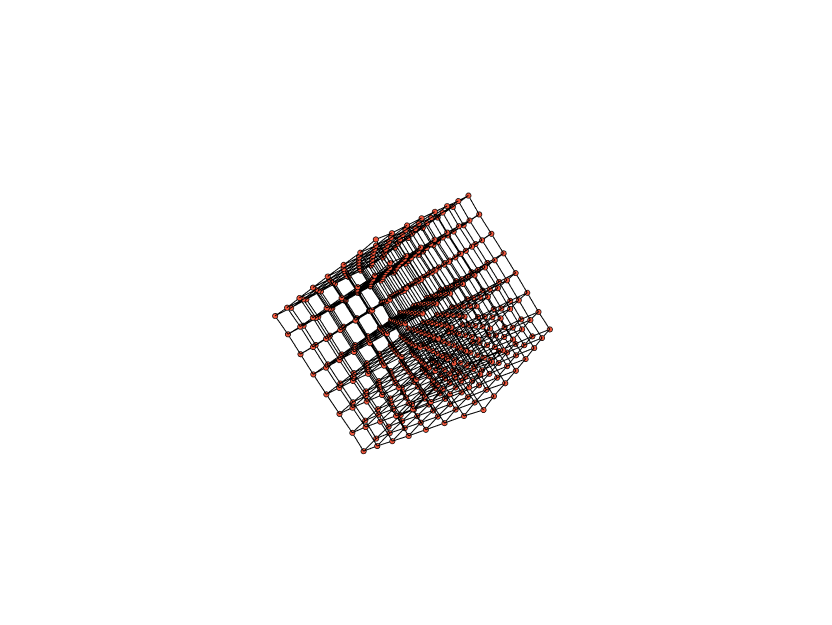

step: 404, Loss change ratio: 0.000668
stopping at step  101
train_fine time: 3.27 s
train time: 17.3 s


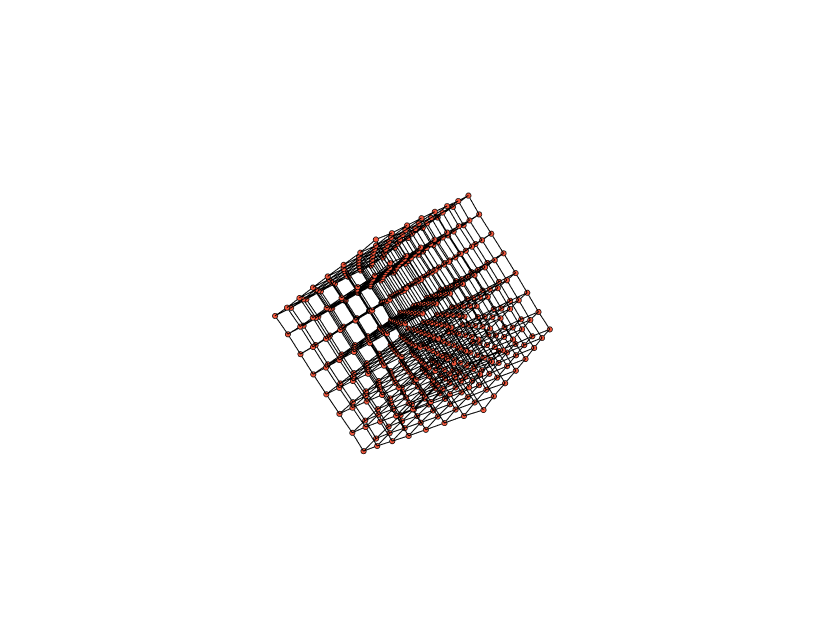

In [7]:
# Here we are running the KKNN algorithm and drawing the layout
# We will see the process of building the final layout

for run in range(e):
  layout = ResGCN(feat_dims=[100,100,DIMENSIONS], A= a, edge_index=edge_index, lr=1e-1, GCN_class='GraphNet')

  start_time = time.time()
  layout.train(gcn_steps=MAX_GCN_STEPS, fdl_steps=MAX_FDL_STEPS,
        early_stop_check_steps = 100,
        min_steps=100,
        gcn_stop_threshold = GCN_STOP_THRESHOLD,
        fdl_stop_threshold = FDL_STOP_THRESHOLD,
        )

plot_layout_3d_dynamic(layout)

In [8]:
# Here we are saving all the intermediate layouts from the train_fine

iteration = 0

for l in layout.layout_history:
    plot_layout_3d_dynamic_save(l, edg, a, iteration)
    iteration += 1

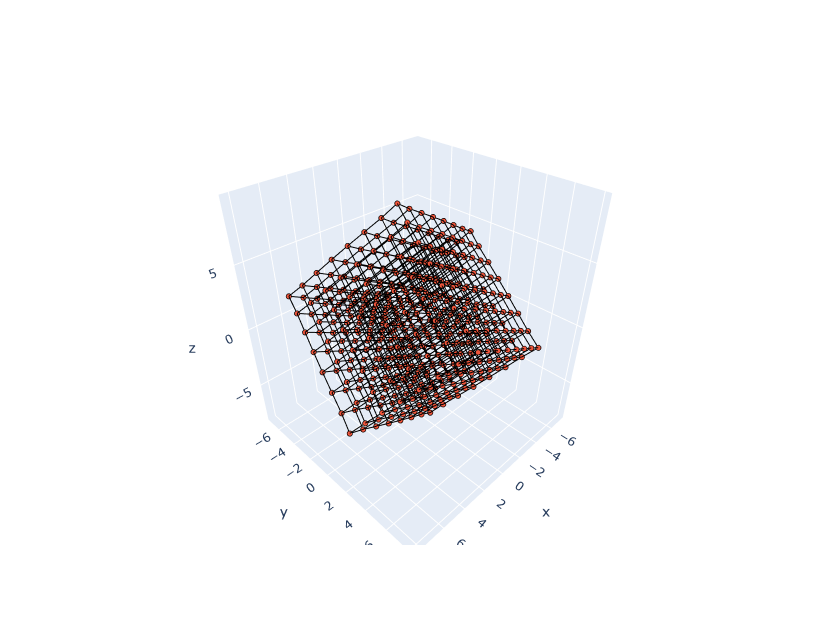

In [10]:
# Here we are running the classic KK algorithm and drawing the layout

class KamadaKawaiLayout:
    def __init__(self, graph, dim=3, tol=1e-2, max_iter=3000, epsilon=1e-6):
        self.graph = graph
        self.dim = dim
        self.tol = tol
        self.max_iter = max_iter
        self.epsilon = epsilon
        self.positions = self.initialize_positions()
        self.distances = self.calculate_shortest_path_distances()
        self.spring_constants = self.calculate_spring_constants()
        self.energy_history = []  # For saving the energy history
        self.intermediate_layouts = []  # For saving intermediate layouts

    def initialize_positions(self):
        pos = torch.rand((len(self.graph.nodes), self.dim), dtype=torch.float32)
        return pos

    def calculate_shortest_path_distances(self): # it's the d matrix in the system energy formula (and also the l matrix)
        adjacency_matrix = nx.to_scipy_sparse_array(self.graph)
        distances = torch.tensor(scipy.sparse.csgraph.floyd_warshall(adjacency_matrix), dtype=torch.float32)
        return distances

    def calculate_spring_constants(self): # it's the k matrix in the system energy formula
        with torch.no_grad():
            d = self.distances
            k = 1.0 / (d**2 + self.epsilon)
            k[torch.isinf(k)] = 0
        return k

    def compute_energy(self):
        diff = self.positions.unsqueeze(1) - self.positions.unsqueeze(0)
        p = torch.sqrt((diff**2).sum(dim=-1) + self.epsilon) # it's the p_i - p_j in the system energy formula
        energy = 0.5 * torch.sum(self.spring_constants * (p - self.distances)**2)
        return energy

    def compute_gradient(self):
        diff = self.positions.unsqueeze(1) - self.positions.unsqueeze(0)
        p = torch.sqrt((diff**2).sum(dim=-1) + self.epsilon)
        term = self.spring_constants * (p - self.distances) / p
        gradient = torch.sum(term.unsqueeze(-1) * diff, dim=1)
        return gradient

    def minimize_energy(self):
        save_iterations = {0, 100, 300, 500}  # Iterations to save intermediate layouts
        for i in range(self.max_iter):
            energy = self.compute_energy()
            self.energy_history.append(energy.item())
            grad = self.compute_gradient()
            if torch.norm(grad) < self.tol:
                break
            self.positions -= 0.01 * grad

            if i in save_iterations:
                # Saving a copy of the positions for intermediate layouts
                self.intermediate_layouts.append(self.positions.clone())

        return self.positions

    def layout(self):
        positions = self.minimize_energy()
        return positions, self.energy_history, self.intermediate_layouts
    
    def plot_layout_3d_dynamic_pos(self, pos, dims=[0,1,2], edges=True, node_kws={}, edg_kws=dict(c='k', lw=1.0)):
        n = pos.shape[0]
        a = torch.tensor(nx.adjacency_matrix(self.graph).todense())
        edg = list(self.graph.edges())
        edge_index = torch.tensor(edg).T

        x_nodes = [pos[i][0] for i in range(n)]
        y_nodes = [pos[i][1] for i in range(n)]
        z_nodes = [pos[i][2] for i in range(n)]

        x_edges, y_edges, z_edges = [], [], []

        for edge in edg:
            x_coords = [pos[edge[0]][0], pos[edge[1]][0], None]
            x_edges += x_coords

            y_coords = [pos[edge[0]][1], pos[edge[1]][1], None]
            y_edges += y_coords

            z_coords = [pos[edge[0]][2], pos[edge[1]][2], None]
            z_edges += z_coords

        trace_edges = go.Scatter3d(x=x_edges, y=y_edges, z=z_edges, mode='lines',
                                   line=dict(color='black', width=2), hoverinfo='none')

        trace_nodes = go.Scatter3d(x=x_nodes, y=y_nodes, z=z_nodes, mode='markers',
                                   marker=dict(symbol='circle', size=3,
                                               colorscale=['lightgreen', 'magenta'],
                                               line=dict(color='black', width=0.5)),
                                   hoverinfo='text')

        axis = dict()
        layout_plotly = go.Layout(title="", width=650, height=625, showlegend=False,
                                  scene=dict(xaxis=dict(axis), yaxis=dict(axis), zaxis=dict(axis)),
                                  margin=dict(t=100), hovermode='closest')

        data = [trace_edges, trace_nodes]
        fig = go.Figure(data=data, layout=layout_plotly)
        fig.show()

# Creating the layout
kk_layout = KamadaKawaiLayout(G)

# Getting the positions and the energy history
positions, energy_history, intermediate_layouts = kk_layout.layout()

# Drawing the layout
kk_layout.plot_layout_3d_dynamic_pos(positions)

In [11]:
# Here the code about loss functions compearing starts (KKNN vs KK)
# choosing where to start observing the loss functions
startIteration = 150

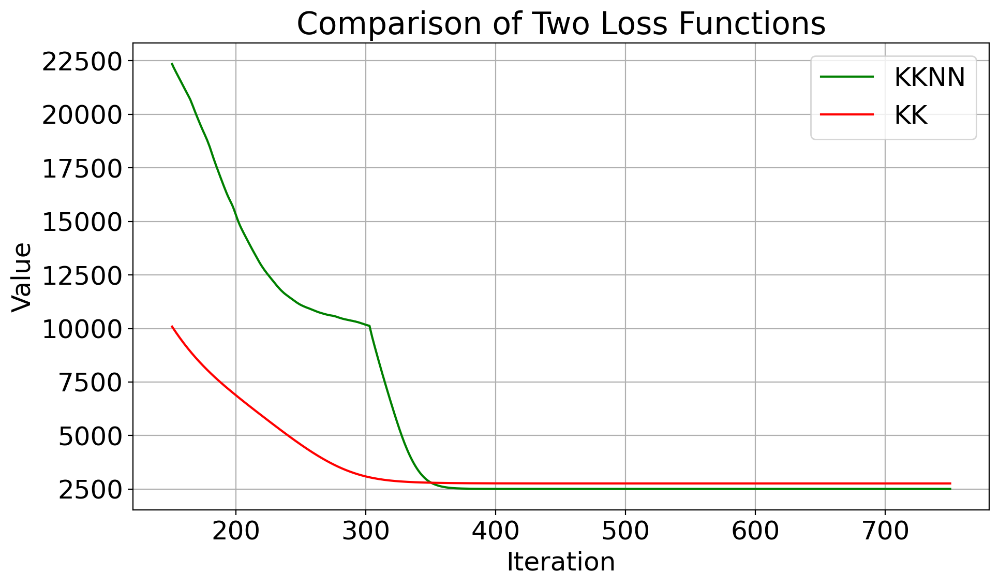

In [12]:
# Creating the arrays to observ
loss1 = layout.loss_history[startIteration:]
loss2 = energy_history[startIteration:]

# Making the arrays to be the same length
max_len = max(len(loss1), len(loss2))

if len(loss1) < max_len:
    loss1 += [loss1[-1]] * (max_len - len(loss1))
if len(loss2) < max_len:
    loss2 += [loss2[-1]] * (max_len - len(loss2))

steps = range(startIteration + 1, max_len + startIteration + 1)

# Drawing loss functions history
plt.figure(figsize=(10, 6))
plt.rcParams.update({'font.size': 18})
plt.plot(steps, loss1, 'g-', label='KKNN')
plt.plot(steps, loss2, 'r-', label='KK')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Comparison of Two Loss Functions')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

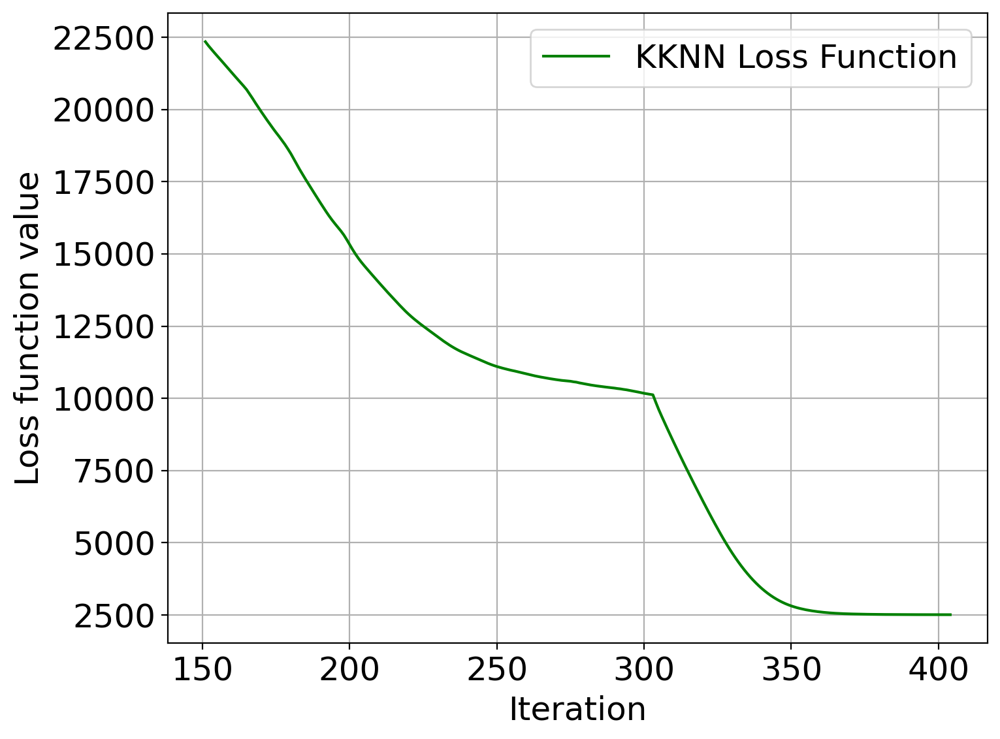

In [13]:
# the iteration/lossValue plot for the KKNN algorythm
loss1 = layout.loss_history[startIteration:]

steps = range(startIteration + 1, len(layout.loss_history) + 1)

plt.figure(figsize=(8, 6))
plt.plot(steps, layout.loss_history[startIteration:], linestyle='-', color='g', label='KKNN Loss Function')
plt.xlabel('Iteration')
plt.ylabel('Loss function value')
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()

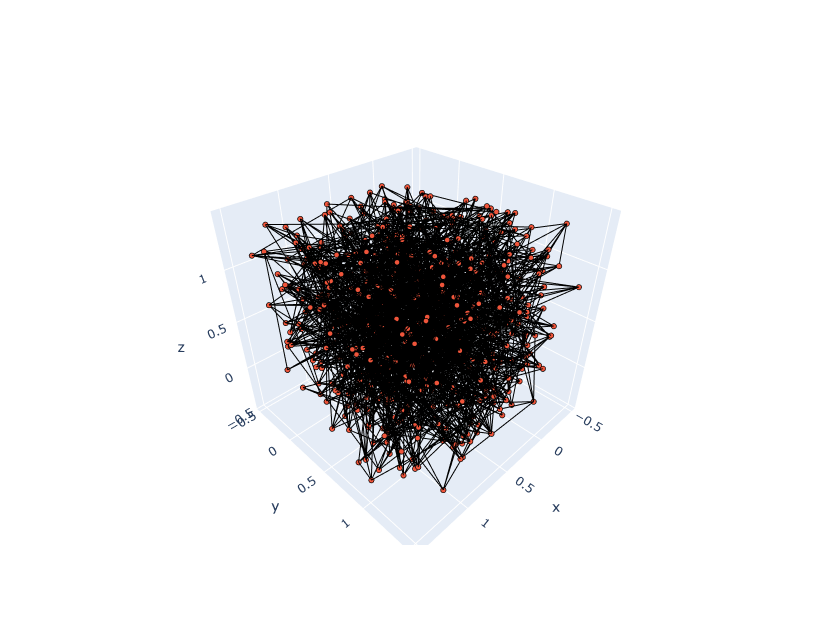

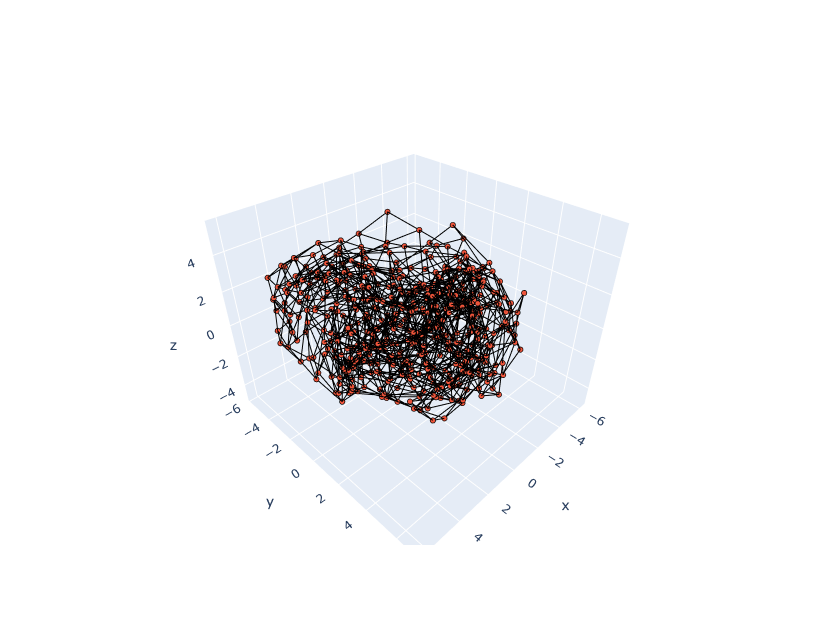

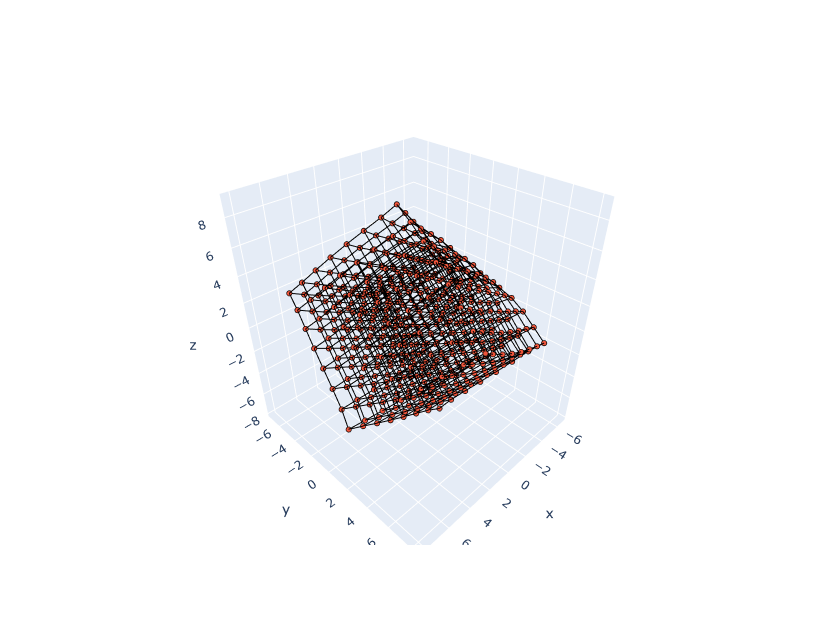

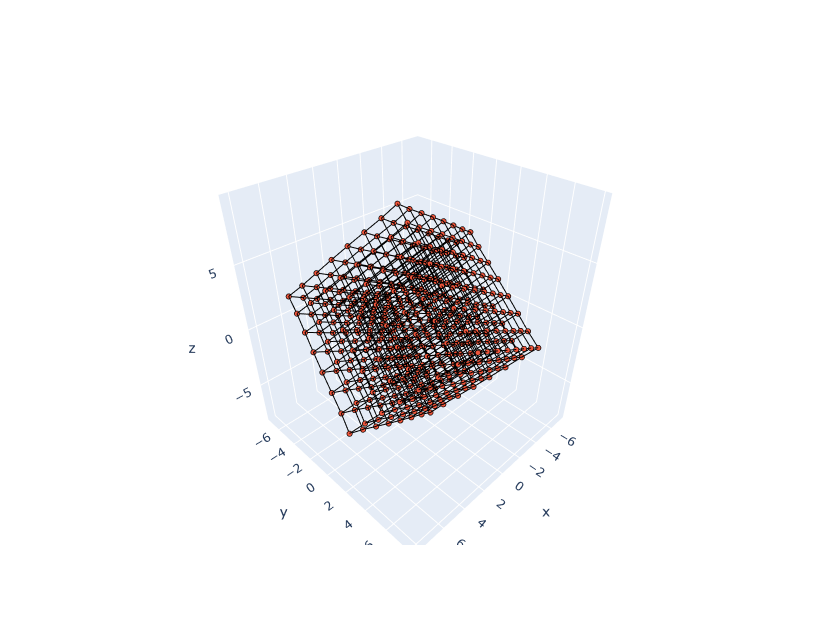

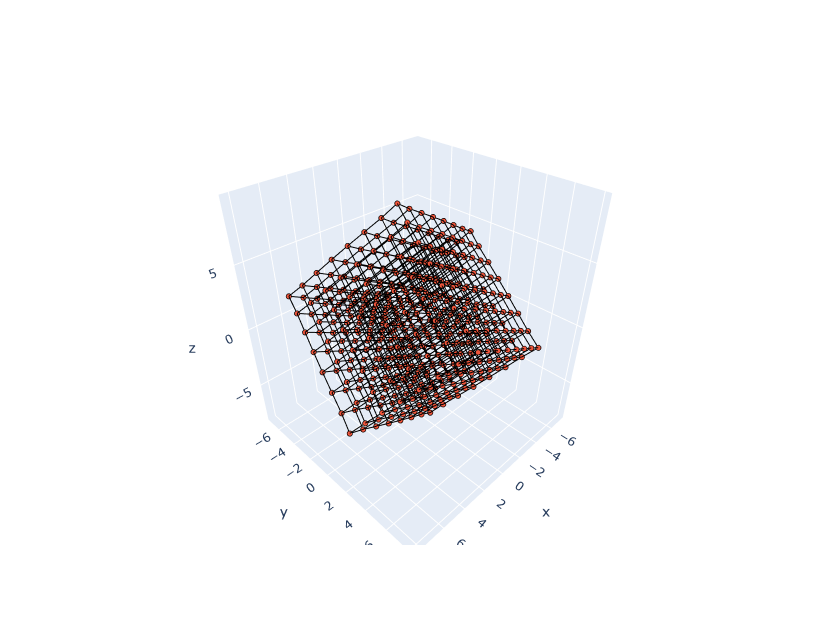

In [14]:
# Plotting intermediate layouts (Kamada-Kawai algorithm)
for l in intermediate_layouts:
    kk_layout.plot_layout_3d_dynamic_pos(l)
    
# Plotting the final layout
kk_layout.plot_layout_3d_dynamic_pos(positions)